# Exploring Juul usage using tweets
Here we attempt to understand the usage of the [Juul](https://www.juulvapor.com), a cigarette alternative using tweets of people talking about the product. Here we use tweets mined from 1st April 2017, to 14th December 2017.

There are a total of **274400** tweets and re-tweets. We remove re-tweets and analyse the remaining **97207** tweets.

## Loading the data
The function `load_data` below is used to load the twitter data from a csv file. Apart from basic clean-up work such as lower casing the tweets, removing re-tweets, and tokenizing sentences, we also compute other metrics such as word frequencies in the tweets, etc. which will be used later.

In [17]:
import bokeh
import bokeh.plotting as bk
import bokeh.models as bk_models
import bokeh.palettes as palettes
import gensim
import itertools as it
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import pickle
import re
import string

from collections import Counter
from gensim.models.wrappers import FastText
from os import path
from sklearn import decomposition
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from types import SimpleNamespace
from wordcloud import WordCloud
from IPython.core.display import display, HTML

# Define paths to various data files
TWEET_FILE = r'D:\Documents\HSC\Data\juulTweets-Full.csv'
# FastText model files can be downloaded from
FAST_TEXT_MODEL_FILE = r'D:\Documents\Resources\wiki.en'

# Open bokeh notebook output
bk.output_notebook()

Loading BokehJS ...

In [18]:
def load_data(filepath, lemmatize, load_saved_pickle=True):
    url_regex = re.compile(
        r'^(?:http|ftp)s?://' # http:// or https://
        r'(?:(?:[A-Z0-9](?:[A-Z0-9-]{0,61}[A-Z0-9])?\.)+(?:[A-Z]{2,6}\.?|[A-Z0-9-]{2,}\.?)|' #domain...
        r'localhost|' #localhost...
        r'\d{1,3}\.\d{1,3}\.\d{1,3}\.\d{1,3})' # ...or ip
        r'(?::\d+)?' # optional port
        r'(?:/?|[/?]\S+)$', re.IGNORECASE)
    tokenizer = nltk.tokenize.TweetTokenizer()
    lemmatizer = nltk.WordNetLemmatizer()
    stopwords = set(nltk.corpus.stopwords.words('english'))
    printable_chars = set(string.printable)
    punctuations = set(string.punctuation)
        
    def load_dataframes(filename):
        # Load the tweeets
        tweet_df = pd.read_csv(filename, usecols=['CreatedAt', 'Id', 'IsRetweet', 'Text', 'UserId'],
                                dtype={ 'CreatedAt': str, 'Text': str },
                                parse_dates=['CreatedAt'])
        tweet_df = tweet_df[tweet_df.IsRetweet == 0]
        tweet_df.set_index(pd.DatetimeIndex(tweet_df.CreatedAt), inplace=True)
        tweet_df['NormalizedText'] = list(map(normalize_tweet, tweet_df.Text))
        
        # Load the word vectors for the tweets 1-grams
        onegram_df = pd.DataFrame(list(nltk.FreqDist(it.chain(*tweet_df.NormalizedText)).items()),
                 columns=['Word', 'Freq'])
        onegram_df['Tweets'] = onegram_df.Word.apply(lambda word: set())
        onegram_df['TweetsCount'] = onegram_df.Word.apply(lambda word: 0)
        onegram_df['IsInteresting'] = onegram_df.Word.apply(lambda word: word not in stopwords and not word.strip().isdigit())
        print('Loading FastText model. Will take a few minutes...')
        ft_model = FastText.load_fasttext_format(FAST_TEXT_MODEL_FILE)
        print('FastText model loaded.')
        onegram_df['Vector'] = list(map(lambda x: ft_model[x] if x in ft_model else np.zeros(300), onegram_df.Word))
        onegram_df.set_index('Word', inplace=True)
        onegram_df.sort_values(['Freq'], ascending=[False], inplace=True)
        for i, tweet in enumerate(tweet_df.NormalizedText):
            for word in tweet:
                onegram_df.loc[word].Tweets.add(i)
                onegram_df.at[word, 'TweetsCount'] = len(onegram_df.loc[word].Tweets)
        
        # Load the bam histogram
        print('Processing bi-grams')
        bigram_df = pd.DataFrame(list(nltk.FreqDist(
                it.chain(*map(lambda x: map('-'.join,
                        filter(lambda bi: all(word not in stopwords and not word.strip().isdigit() for word in bi),
                               nltk.bigrams(x))), tweet_df.NormalizedText))).items()),
                columns=['Word', 'Freq'])
        bigram_df['Tweets'] = bigram_df.Word.apply(lambda word: set())
        bigram_df['TweetsCount'] = bigram_df.Word.apply(lambda word: 0)
        bigram_df.set_index('Word', inplace=True)
        bigram_df.sort_values(['Freq'], ascending=[False], inplace=True)
        for i, tweet in enumerate(tweet_df.NormalizedText):
            for bigram in filter(lambda bi: all(word not in stopwords and not word.strip().isdigit() for word in bi), nltk.bigrams(tweet)):
                key = '-'.join(bigram)
                bigram_df.loc[key].Tweets.add(i)
                bigram_df.at[key, 'TweetsCount'] = len(bigram_df.loc[key].Tweets)
        return tweet_df, onegram_df, bigram_df
    
    def normalize_tweet(tweet):
        words = []
        clean_tweet = ''.join(filter(lambda c: c in printable_chars, tweet))
        for token, tag in nltk.pos_tag(tokenizer.tokenize(clean_tweet.lower())):
            if len(token) < 2 or url_regex.search(token):
                continue
            elif all(char in punctuations for char in token):
                continue
            elif token[0] == '@':
                token = '@person' #Replace all friend tags with a common token.
                tag = 'NNP'
            words.append(lemmatizeToken(token, tag) if lemmatize else token)
        return words
    
    def lemmatizeToken(token, tag):
        tag = {
            'N': nltk.corpus.wordnet.NOUN,
            'V': nltk.corpus.wordnet.VERB,
            'R': nltk.corpus.wordnet.ADV,
            'J': nltk.corpus.wordnet.ADJ
        }.get(tag[0], nltk.corpus.wordnet.NOUN)
        return lemmatizer.lemmatize(token, tag)
    
    pickle_filename = path.join(path.dirname(filepath), ('pickled/%s%s.pickle' % (path.basename(filepath), '-lemmatized' if lemmatize else '')))
    if load_saved_pickle and path.exists(pickle_filename):
        print('Found pickle at %s' % pickle_filename)
        with open(pickle_filename, 'rb') as pickle_file:
            print('Loading from the pickle: ' + pickle_filename)
            return pickle.load(pickle_file)
    print('No pickle found at %s. Creating optimized files.' % pickle_filename)
    dfs = load_dataframes(filepath)
    result = SimpleNamespace(tweets=dfs[0], onegrams=dfs[1], bigrams=dfs[2])
    with open(pickle_filename, 'wb') as pickle_file:
        pickle.dump(result, pickle_file)
    return result

Below is a preview of the twitter data available. The text column contains the tweet, the normalized text column (explained in the next section) contains the tokenized tweets in the form of a list. We have already removed all re-tweets, hence `IsRetweet` is 0.

In [19]:
data = load_data(TWEET_FILE, lemmatize=False)
print('Number of tweets: %d' % data.tweets.shape[0])
data.tweets.head(n=7)

Found pickle at D:\Documents\HSC\Data\pickled/juulTweets-Full.csv.pickle
Loading from the pickle: D:\Documents\HSC\Data\pickled/juulTweets-Full.csv.pickle
Number of tweets: 81578


,Id,CreatedAt,Text,UserId,IsRetweet,NormalizedText
CreatedAt,,,,,,
2017-04-01 00:16:36,848071584178778112,2017-04-01 00:16:36,when your homie that owns a vape shop tells yo...,1194028124,0,"[when, your, homie, that, owns, vape, shop, te..."
2017-04-01 04:02:40,848128476263710720,2017-04-01 04:02:40,Discover the Vaping difference! #Vapetampabay ...,4855026431,0,"[discover, the, vaping, difference, #vapetampa..."
2017-04-01 09:00:33,848203441474347011,2017-04-01 09:00:33,ðŸ“· myampgoesto11: â€œHe who has overcome his...,53930102,0,"[myampgoesto, 11, he, who, has, overcome, his,..."
2017-04-01 10:31:56,848226437610037248,2017-04-01 10:31:56,Why has vape/Juul become part of my personality?,357112374,0,"[why, has, vape, juul, become, part, of, my, p..."
2017-04-01 16:29:15,848316359327051776,2017-04-01 16:29:15,vape shops r wild selling mango juul pods for $40,1240186843,0,"[vape, shops, wild, selling, mango, juul, pods..."
2017-04-01 17:11:50,848327073034850304,2017-04-01 17:11:50,I added a video to a @YouTube playlist https:/...,30799931,0,"[added, video, to, @person, playlist, juul, va..."
2017-04-01 17:29:28,848331511963287554,2017-04-01 17:29:28,I liked a @YouTube video from @tiavapes https:...,38614922,0,"[liked, @person, video, from, @person, juul, v..."


## Cleaning the data
The above tweets were colleced with very loose pre-conditions i.e. the tweet should contain the word `juul`. Unfortuantely, the word `juul` is frequently used in nordic languages, and can be a part of words in other languages (such as in names).
In order to clean the data we will discard tweets:
1. when juul in middle of word
2. when tweet language not english
3. when the `juul` word refers to a person (handled by removing non-english tweets).
4. when the user is a bot
5. when tweets mention that they are ads (or are from pages that are companies).

### Removing `juul` in middle of words

In [8]:
def remove_tweets_on_condition(data, predicate):
    tweet_drop_indices = set()
    onegram_drop_indices = {}
    bigram_drop_indices = {}
    for i, row in enumerate(data.tweets.itertuples()):
        if predicate(i, row):
            tweet_drop_indices.add(row.Index)
            for word in row.NormalizedText:
                onegram = data.onegrams.loc[word]
                if word not in onegram_drop_indices:
                    onegram_drop_indices[word] = [onegram.Freq, set()]
                onegram_drop_indices[word][0] -= 1
                onegram_drop_indices[word][1].add(i)
            for words in nltk.bigrams(row.NormalizedText):
                key = '-'.join(words)
                if key in data.bigrams.index:
                    bigram = data.bigrams.loc[key]
                    if key not in bigram_drop_indices:
                        bigram_drop_indices[key] = [bigram.Freq, set()]
                    bigram_drop_indices[key][0] -= 1
                    bigram_drop_indices[key][1].add(i)
    for bigram in bigram_drop_indices:
        data.bigrams.at[bigram, 'Freq'] = bigram_drop_indices[bigram][0]
        data.bigrams.at[bigram, 'Tweets'] = data.bigrams.at[bigram, 'Tweets'] - bigram_drop_indices[bigram][1]
        data.bigrams.at[bigram, 'TweetsCount'] = len(data.bigrams.at[bigram, 'Tweets'])
    data.bigrams.drop(data.bigrams[data.bigrams.Freq == 0].index, inplace=True)
    for word in onegram_drop_indices:
        data.onegrams.at[word, 'Freq'] = onegram_drop_indices[word][0]
        data.onegrams.at[word, 'Tweets'] = data.onegrams.at[word, 'Tweets'] - onegram_drop_indices[word][1]
        data.onegrams.at[word, 'TweetsCount'] = len(data.onegrams.at[word, 'Tweets'])
    data.onegrams.drop(data.onegrams[data.onegrams.Freq == 0].index, inplace=True)
    data.tweets.drop(tweet_drop_indices, inplace=True)
    return data


juul_keywords = {'juul', 'juuls', '#juul', 'juuling'}

def juul_substring_detect(row_num, row):
    return all(word not in juul_keywords for word in row.NormalizedText)

print('Original number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))
remove_tweets_on_condition(data, juul_substring_detect)
print('Reduced number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))

Original number of: 
	* tweets = 97207
	* onegrams = 45762
	* bigrams = 165683
Reduced number of: 
	* tweets = 94585
	* onegrams = 43760
	* bigrams = 159147


### Remove non-English tweets
We use a language detection library created by Google. This library has shown 99% accuracy on passages from wikipedia. Unfortunately, our tweets are much smaller than the passages it was trained on, and hence has a lower accuracy. Therefore, I went through 200 samples of each language classifications of our tweets, and selected those languages which have a high representation of english tweets.

In [9]:
from langdetect import detect

accepted_langs = {'en', 'et', 'ro', 'ca', 'sw', 'fi', 'sk', 'so', 'id', 'fr',\
                  'pl', 'sv', 'hr', 'sl', 'tl', 'it', 'cy', 'sq', 'cs', 'hu'}

def non_english_tweet_detect(row_num, row):
    if row_num % 10000 == 0:
        print('Finished %d' % row_num)
    try:
        lang = detect(row.Text)
        return lang not in accepted_langs
    except Exception as e:
        return False

print('Original number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))
remove_tweets_on_condition(data, non_english_tweet_detect)
print('Reduced number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))

Original number of: 
	* tweets = 94585
	* onegrams = 43760
	* bigrams = 159147
Finished 0
Finished 10000
Finished 20000
Finished 30000
Finished 40000
Finished 50000
Finished 60000
Finished 70000
Finished 80000
Finished 90000
Reduced number of: 
	* tweets = 87051
	* onegrams = 33890
	* bigrams = 126454


### Removing bot and spam users
A lot of the tweets would have been genereated by bots and ad pages. [Botometer](https://botometer.iuni.iu.edu/#!/) is a free service run by Indiana University's Network Science Institue which detects bot accounts on twitter.
Given a twitter user handle (@person), Botometer returns two scores between 0 and 1 which represent the probability that a user is a bot. The first score should be used when the user is an English speaker, the second for non-English pages.

Another thing to notice is that a approximately 10% of the users have no bot score. This is because either their accouts have been locked from public view, have been deleted, or had a name change.

In [20]:
def get_users(source_dir):
    public = pd.read_csv(source_dir + r'\juulUsersVerified.csv', delimiter=',', index_col=0)
    private = pd.read_csv(source_dir + r'\juulUsersVerified-Fail.csv', delimiter=',', index_col=0)
    return SimpleNamespace(public=public, private=private)

user_bot_score_dir = r'D:\Documents\HSC\Data\BotScoredUsers'
users = get_users(user_bot_score_dir)

print('Number of users scored: %d' % users.public.shape[0])
print('Number of tweets from scored users: %d' % data.tweets[data.tweets.UserId.isin(users.public.index)].shape[0])
print('Number of users un-scored: %d' % users.private.shape[0])
print('Number of tweets from un-scored users: %d' % data.tweets[data.tweets.UserId.isin(users.private.index)].shape[0])

Number of users scored: 50447
Number of tweets from scored users: 71329
Number of users un-scored: 4525
Number of tweets from un-scored users: 6340


Since we are dealing with probabilities rather than a 0/1 classification of users into bots or nots, it would be usefult to look at the bot score distribution of users and tweets. If `p` represents the probability that a user `u` is a bot, we can assume that the probability that any tweet `t` of `u` is also a bot with probability `p`.

In [11]:
def plot_bot_scores(users, tweets):
    bins = {'user_english': None, 'tweet_english': None, 'user_universal': None, 'tweet_universal': None}
    for key in bins:
        bins[key] = {start: 0 for start in range(0, 11)}
    grouped_tweets = tweets.groupby('UserId')
    for user in users.itertuples():
        score_bin_english = int(user.EnglishScore * 10)
        score_bin_universal = int(user.UniversalScore * 10)
        bins['user_english'][score_bin_english] += 1
        bins['user_universal'][score_bin_universal] += 1
        user_tweet_count = len(grouped_tweets.groups.get(user.Index, []))
        bins['tweet_english'][score_bin_english] -= user_tweet_count
        bins['tweet_universal'][score_bin_universal] -= user_tweet_count
    
    # Plot bins
    extra_y_start = min(it.chain(bins['tweet_english'].values(), bins['tweet_universal'].values())) - 500
    fig_english = bk.figure(plot_width=500, plot_height=500, title='English Score Distr')
    fig_english.extra_y_ranges = {'tweets': bk_models.Range1d(start=extra_y_start, end=22500)}
    fig_english.add_layout(bk_models.LinearAxis(y_range_name='tweets'), 'right')
    fig_english.vbar(x=list(bins['user_english'].keys()), width=0.95, bottom=0, top=list(bins['user_english'].values()))
    fig_english.vbar(x=list(bins['tweet_english'].keys()), width=0.95, bottom=0, top=list(bins['tweet_english'].values()),
                     y_range_name='tweets', color='red')
    
    fig_universal = bk.figure(plot_width=500, plot_height=500, title='Universal Score Distr')
    fig_universal.extra_y_ranges = {'tweets': bk_models.Range1d(start=extra_y_start, end=22500)}
    fig_universal.add_layout(bk_models.LinearAxis(y_range_name='tweets'), 'right')
    fig_universal.vbar(x=list(bins['user_universal'].keys()), width=0.95, bottom=0, top=list(bins['user_universal'].values()))
    fig_universal.vbar(x=list(bins['tweet_universal'].keys()), width=0.95, bottom=0, top=list(bins['tweet_universal'].values()),
                     y_range_name='tweets', color='red')
    bk.show(bokeh.layouts.row(fig_english, fig_universal))
    
plot_bot_scores(users.public, data.tweets)

From the looks of it, very few users have a high probability of being bots. This is further supported by the fact that very few users have high tweet count. The mean number of tweets per user is **1.6**. We can set our threshold at 0.8 i.e we don't select tweets from users who have at least a 80% certainity that they are bots.

In [12]:
bot_threshold = 0.8

def detect_tweets_below_threshold(row_num, row):
    if row.UserId not in users.public.index:
        return False
    user = users.public.loc[row.UserId]
    return user.EnglishScore > bot_threshold or user.UniversalScore > bot_threshold

print('Original number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))
remove_tweets_on_condition(data, detect_tweets_below_threshold)
print('Reduced number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))

Original number of: 
	* tweets = 87051
	* onegrams = 33890
	* bigrams = 126454
Reduced number of: 
	* tweets = 86060
	* onegrams = 33772
	* bigrams = 125877


### Manual removal of some tweets and users
We will manually eyeball some tweets from users with high tweet rates (i.e. total number of tweets > 20) and remove users that we see as spammers. At the same time some tweets will contain information that thay are advertisements (like #ad, etc.); we will also remove them.

In [68]:
def get_high_freq_users(tweets):
    grouped = tweets.groupby('UserId', as_index=False)[['Id']]\
                .aggregate(pd.Series.tolist)\
                .rename({'Id': 'Ids'}, axis=1)\
                .set_index('UserId')
    grouped['Count'] = grouped.Ids.apply(lambda x: len(x))
    grouped.sort_values('Count', inplace=True, ascending=False)
    return grouped

with open(r'D:\Documents\HSC\user-review.tsv', 'w') as file:
    import random
    high_freq_users = get_high_freq_users(data.tweets)
    display(high_freq_users.head())
    for row in high_freq_users[high_freq_users.Count > 20].itertuples():
        tweets = data.tweets[data.tweets.Id.isin(random.sample(row.Ids, 10))]
        for tweet in tweets.itertuples():
            file.write('%s\t%s\n' % (row.Index, ' '.join(tweet.NormalizedText)))

,Ids,Count
UserId,,
765945227286867968,"[851849617276678144, 851849626403520512, 85184...",725
2918018660,"[851540187163369473, 851591685738049537, 85184...",365
545171828,"[851537186398900227, 851538320911978497, 85191...",179
1259535607,"[911962199496822784, 912017570252951552, 91210...",140
3196451855,"[851639806190915584, 851865067448664068, 85269...",122


After manually identifing promotional, and unrelated pages we end up with the following user ids to remove:

In [77]:
unwanted_users = {765945227286867968, 2918018660, 545171828, 1259535607, 3196451855, 736379404939452416, 864085200728412160, 888074510410407937, 26619156, 846461177500618752, 3091997183, 2383978682, 2186737325, 4766559765, 229900055, 888508973812502529, 916705999205076992, 322259193, 3004217368, 878034154910339073, 2276508654, 2983377258, 871833135771774977, 1636851684, 855125939411353603, 108455155, 901568198977380352, 842130884, 875002282802376704, 188790888, 2846486337, 46587072, 6690342, 903095088263217152, 48384673, 2436003912, 3146552676, 3154055704, 2868079980, 56750930, 809812325188386816, 75825173, 877012199775928320, 4841308393}
print('Number of tweets by unwanted users: %d' % data.tweets[data.tweets.UserId.isin(unwanted_users)].shape[0])

Number of tweets by unwanted users: 3093


We can also use keywords that identify promotional pages (such as #ad, #deal, etc.) and remove tweets containing such hashtags.

In [89]:
unwanted_hashtags = {'#giveaway', '#interiordesign', '#ad', '#design', '#architecture', '#architects',
       '#kirloskar', '#desterrenvanbijons',
       '#tech', '#nyc', '#nowplaying',
       '#startups', '#soundcloud', '#contestalert', '#startup',
       '#team1d', '#teamniall', '#pods', '#nbforum2017',
       '#decoration', '#homedecor', '#np', '#ebay', '#giro100', '#judo',
       '#deal', '#hardware', '#denmark', '#blessed', '#deals', '#policy',
       '#tv', '#consumerelectronics', '#bargain', '#neverloseyourjuulagain',
       '#socialsurvey', '#kopen',
       '#techcrunch', '#vapensmokeshop'}
print('Number of tweets containing unwanted hashtags: %d' % data.tweets[data.tweets.NormalizedText.apply(lambda ls: any(l in unwanted_hashtags for l in ls))].shape[0])

Number of tweets containing unwanted hashtags: 1513


In [92]:
def detect_unwanted_users_and_hashtags(row_num, row):
    return row.UserId in unwanted_users or any(l in unwanted_hashtags for l in row.NormalizedText)

print('Original number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))
remove_tweets_on_condition(data, detect_unwanted_users_and_hashtags)
print('Reduced number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data.tweets.shape[0], data.onegrams.shape[0], data.bigrams.shape[0]))

Original number of: 
	* tweets = 86060
	* onegrams = 33772
	* bigrams = 125877
Reduced number of: 
	* tweets = 81578
	* onegrams = 32755
	* bigrams = 121997


### Saving the changes
We will save our new filtered tweets in a cache so that we can easily access them in the future.

In [95]:
def save_data(data, file_name):
    if path.exists(file_name):
        backup_file = path.join(path.dirname(file_name), path.basename(file_name) + '.backup')
        if path.exists(backup_file):
            raise Exception('Delete backup first.')
        from shutil import copyfile
        copyfile(file_name, backup_file)
    with open(file_name, 'wb') as pickle_file:
        pickle.dump(data, pickle_file)

save_data(data, TWEET_FILE + '.pickle')

Plotting the number of tweets per month:

In [5]:
def plot_tweets_against_time(tweets):
    monthly_tweet_counts = [tweets[tweets.index.month == month].shape[0] for month in range(4, 12)]
    #print(monthly_tweet_counts, tweets[tweets.index.month == 12].shape[0])
    months = ['Apr-17', 'May-17', 'Jun-17', 'Jul-17', 'Aug-17', 'Sept-17', 'Oct-17', 'Nov-17']
    fig = bk.figure(plot_width=500, plot_height=500, x_range=months, title='Number of tweets vs time')
    fig.vbar(x=months, width=0.9, top=monthly_tweet_counts)
    bk.show(fig)

plot_tweets_against_time(data.tweets)

def plot_tweets_against_time_weekly(tweets):
    weekly_tweet_counts = [tweets[tweets.index.week == week].shape[0] for week in range(13, 51)]
    #print(weekly_tweet_counts)
    fig = bk.figure(plot_width=500, plot_height=500, title='Number of tweets vs time')
    fig.vbar(x=range(13,51), width=0.9, top=weekly_tweet_counts)
    bk.show(fig)

plot_tweets_against_time_weekly(data.tweets)

## A picture of a thousand words
Word clouds are an useful visualization tool we can use to understand what themes are common among the tweets. To create the word clouds we first need to obtain the frequency of each word in all tweets. We can then visualize the weight of a word in the whole data set. This can help us get a feel of what juul users commonly talk about.

### Text normalization
In order to effectively analyze text data, we need to apply a number of normalizations which help reduce the noise in the data. We apply the following normalization to each tweet:
1. **Basic normalization**: Lower case all tweets, remove extra spaces, remove punctuation between words.
1. **Stop word removal**: Words such as 'a', 'the', etc. are heavily represented in the English language. Such words add to the syntax, but rarely add to the meaning of the sentence. To make analysis easier, we ignore these words.
2. **Normalizing twitter user mentions**: In twitter `@person_name` is used to tag people, and pages in your post. The name of each person tagged has little importance to us, but we would like to maintain statistics on the number of people tagged. Therefore, all `@xyz` occurrences in the tweets have been replaced by `@person` - a common token for all people.
3. **Lemmatization**: Words such as 'mangoes', and 'mango' should be conflated in our analysis, so we would like to break down words into their basic form by removing inflections, and variants.
4. **Non-printable character removal**: Unicode characters in tweets are often used for emoticons, or as symbols from other languages. Since we are dealing with tweets in English, we can remove these symbols without much loss in the meaning of the sentence.

In [6]:
data_lemmatized = load_data(TWEET_FILE, lemmatize=True)
data_lemmatized.tweets.head(n=7)

Loading from the pickle: D:\Documents\HSC\juulTweets-Full.csv-lemmatized.pickle


,Id,CreatedAt,Text,UserId,IsRetweet,NormalizedText
CreatedAt,,,,,,
2017-04-01 00:16:36,848071584178778112,2017-04-01 00:16:36,when your homie that owns a vape shop tells yo...,1194028124,0,"[when, your, homie, that, own, vape, shop, tel..."
2017-04-01 04:02:40,848128476263710720,2017-04-01 04:02:40,Discover the Vaping difference! #Vapetampabay ...,4855026431,0,"[discover, the, vaping, difference, #vapetampa..."
2017-04-01 09:00:33,848203441474347011,2017-04-01 09:00:33,ðŸ“· myampgoesto11: â€œHe who has overcome his...,53930102,0,"[myampgoesto, 11, he, who, have, overcome, his..."
2017-04-01 10:31:56,848226437610037248,2017-04-01 10:31:56,Why has vape/Juul become part of my personality?,357112374,0,"[why, have, vape, juul, become, part, of, my, ..."
2017-04-01 16:29:15,848316359327051776,2017-04-01 16:29:15,vape shops r wild selling mango juul pods for $40,1240186843,0,"[vape, shop, wild, selling, mango, juul, pod, ..."
2017-04-01 17:11:50,848327073034850304,2017-04-01 17:11:50,I added a video to a @YouTube playlist https:/...,30799931,0,"[add, video, to, @person, playlist, juul, vapo..."
2017-04-01 17:29:28,848331511963287554,2017-04-01 17:29:28,I liked a @YouTube video from @tiavapes https:...,38614922,0,"[like, @person, video, from, @person, juul, va..."


Similar to what we did with `data` we need to clean up the lemmatized tweets too.

In [98]:
print('Original number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data_lemmatized.tweets.shape[0], data_lemmatized.onegrams.shape[0], data_lemmatized.bigrams.shape[0]))
remove_tweets_on_condition(data_lemmatized, juul_substring_detect)
remove_tweets_on_condition(data_lemmatized, non_english_tweet_detect)
remove_tweets_on_condition(data_lemmatized, detect_tweets_below_threshold)
remove_tweets_on_condition(data_lemmatized, detect_unwanted_users_and_hashtags)
print('Reduced number of: \n\t* tweets = %d\n\t* onegrams = %d\n\t* bigrams = %d' % (data_lemmatized.tweets.shape[0], data_lemmatized.onegrams.shape[0], data_lemmatized.bigrams.shape[0]))
save_data(data_lemmatized, TWEET_FILE + '-lemmatized.pickle')

Original number of: 
	* tweets = 81567
	* onegrams = 29204
	* bigrams = 113463
Reduced number of: 
	* tweets = 81567
	* onegrams = 29204
	* bigrams = 113463


The word frequencies for the top 7 *interesting* words is shown below. Here, *interesting* is defined as words which are not numbers, and which aren't stop words.

In [99]:
data_lemmatized.onegrams[data_lemmatized.onegrams.IsInteresting].head(n=7)

,Freq,Tweets,TweetsCount,IsInteresting,Vector
Word,,,,,
juul,81287,"{8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 20, 22,...",80497,True,"[-0.287623, -0.572146, -0.596001, 0.249324, -0..."
@person,20138,"{65538, 65540, 65541, 65542, 11, 12, 65547, 20...",19637,True,"[0.129165250589, -0.291929764892, -0.178215235..."
pod,11148,"{32770, 65540, 32776, 10, 65549, 65552, 18, 65...",11931,True,"[-0.374593, 0.304148, -0.0465537, 0.0675196, 0..."
get,8242,"{32780, 65549, 65550, 65551, 32783, 65554, 327...",8275,True,"[0.16691, 0.0201641, -0.0975422, -0.0338048, -..."
hit,8092,"{65539, 81924, 65541, 81926, 81928, 65547, 327...",7903,True,"[0.131184, -0.387129, -0.0681126, 0.170825, -0..."
like,4413,"{16389, 65544, 32778, 12, 81935, 19, 20, 49174...",4613,True,"[0.0308166, 0.156366, -0.0983921, 0.179355, 0...."
buy,4561,"{49160, 65545, 49162, 32783, 49169, 65553, 327...",4551,True,"[-0.301692, 0.28251, 0.0680349, -0.0908526, 0...."


A word cloud is a convenient visualization tool for data the above data.

In [74]:
def create_wordcloud(freqDict, w=800, h=600):
    wc = WordCloud(width=w, height=h).generate_from_frequencies(freqDict)
    plt.figure(figsize=(30,30))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()

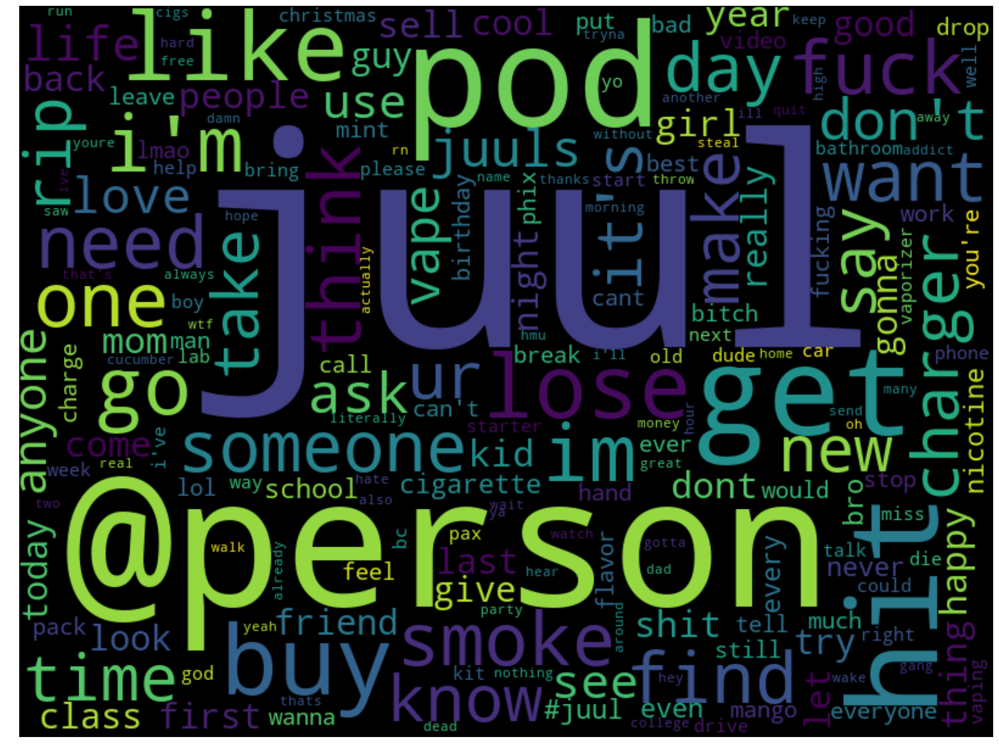

In [31]:
create_wordcloud(data_lemmatized.onegrams[data_lemmatized.onegrams.IsInteresting].to_dict()['Freq'])

### Bigram wordclouds
From the above wordcloud we can infer that users of the juul talk a lot about things like *flavors* (mango, mint, etc.), the juul charger, finding the juul, etc. But a lot of words such as 'take', 'make', 'someone' don't convey much meaning by themselves. To gain more context, we can create a wordcloud with bigrams i.e. word pairs, instead of onegrams (single words).
This simple extension should paint a clearer picture without much effort.

Similar to the onegrams, we calculated the bigram frequencies while loading the data. We have also removed all bigrams composed of one or more non-interesting words.

,Freq,Tweets,TweetsCount
Word,,,
juul-pod,9171,"{32770, 65540, 32776, 10, 65549, 65552, 65557,...",9713
@person-@person,3290,"{40963, 65541, 24583, 40973, 16400, 16401, 491...",3229
@person-juul,1718,"{90113, 24587, 12, 40973, 24588, 24593, 8211, ...",2267
get-juul,2000,"{73729, 24580, 40965, 65549, 16398, 65554, 327...",2108
buy-juul,1967,"{4097, 53250, 36867, 49160, 65545, 49162, 5326...",1989
juul-charger,1584,"{16387, 32773, 57355, 61453, 73748, 24599, 450...",1632
happy-juul,66,"{4096, 10240, 4098, 4099, 10241, 2053, 4102, 4...",1094


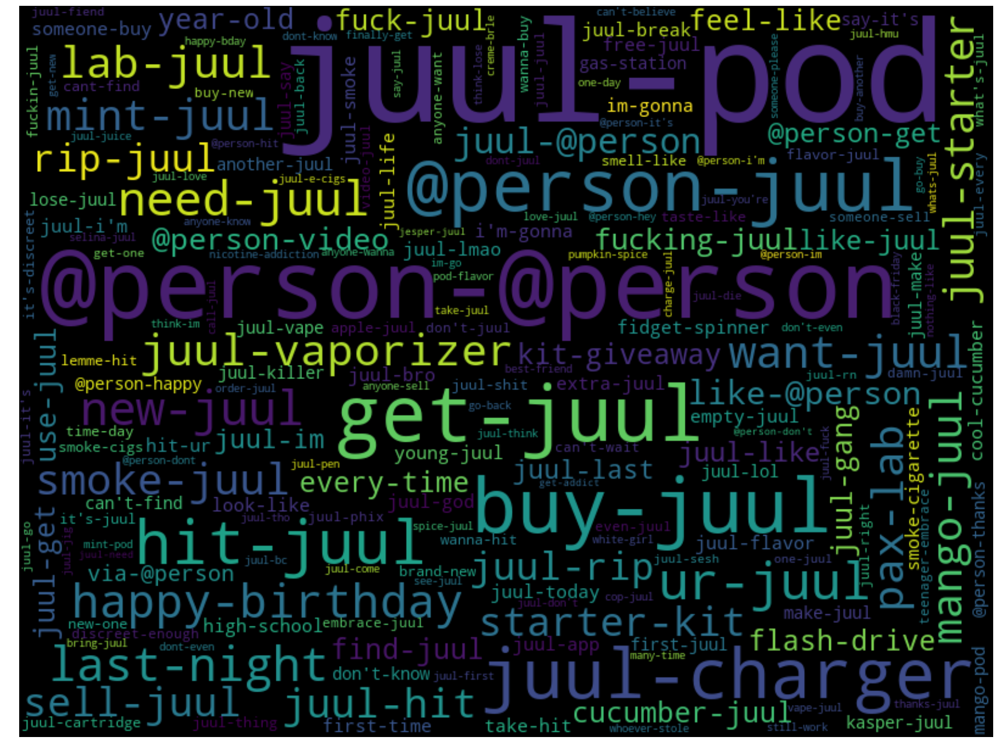

In [103]:
display(data_lemmatized.bigrams.head(n=7))
create_wordcloud(data_lemmatized.bigrams.to_dict()['Freq'])

From the above picture we can deduce a few common themes:
- **Flavors**: Words like Mango, cucumber, mint, flavor, etc.
- People tag their friends a lot when talking about the juul (indicated by `@person-@person` in the wordcloud). This indicates that the juul is a social phenomenon. Other bigrams such as `juul-gang`, `happy-birthday` also strengthen this hypothesis.
- Twitter is a hot bed for buying and selling juuls (indicated by `buy-juul`, `sell-juul`, `get-juul`, `want`, `buy`, etc.
- As expected a lot of tweets describe positive (and often addictive) experiences while using a juul. Eg: `love-juul`, `need-juul`, `hit-juul`, `juul-hit`, `take-juul`, etc.

Interestingly, the co-occurrence of the word juul with other tobacco products helped identify a new product named [phix](http://phixvapor.com/). This is a competitor to juul, and a lot of tweets compare the juul with the phix (as well as with other tobacco products). The figure below displays the frequency of words describing other tobacco products in juul related tweets. The numbers indicate that, at least in the juul community, while not as popular as vapes, phix is still pretty popular despite it being a new comer.

In [10]:
data_lemmatized.onegrams.loc[['vape', 'phix', 'cigarette', 'hookah']].drop('Vector', axis=1)

,Freq,Tweets,TweetsCount,IsInteresting
Word,,,,
vape,1924,"{0, 1, 6, 57351, 16390, 9, 10, 19, 40987, 1641...",1868,True
phix,798,"{86020, 20485, 86022, 86024, 12300, 86030, 614...",764,True
cigarette,1245,"{14336, 8193, 8194, 22528, 4100, 57346, 18438,...",1228,True
hookah,53,"{7553, 28548, 59913, 89354, 87051, 72588, 7554...",52,True


A worrying observation is the existence and considerable presence of patterns like `high-school`, and `school` in the word cloud. This indicates juul usage among minors. The table below displays the word frequency of these key words.

In [11]:
pd.concat([data_lemmatized.onegrams.loc[['school']].drop(['Vector', 'IsInteresting'], axis=1),
          data_lemmatized.bigrams.loc[['high-school']]])

,Freq,Tweets,TweetsCount
Word,,,
school,1113,"{75776, 77824, 86021, 73735, 38930, 14355, 676...",1077
high-school,201,"{76802, 91652, 13829, 80390, 56850, 14355, 676...",199


## Deep dive

The previous observations on high school usage, and the discovery of new juul competitors are worth a deeper dive. Are there other products similar to the `phix` that aren't obvious from the word cloud? Similarly, are there other words which might indicate underage usage of the juul? In other words we want to find words that might be similar in usage to `school`, or `phix`.

Word vectors are representations of words as vectors in a multi-dimensional space. In such a representation, words with similar meaning/usage in documents cluster together in the dimensional space. This property can help us discover other interesting insights in our dataset.

Below is a plot of our onegram vectors. Words related to the above identified themes are highlighted.

In [12]:
def plot_words(onegram_freq_df, highlight, freq_cutoff=10, algo='pca', perplexity=80):
    frequent_words = onegram_freq_df[onegram_freq_df.TweetsCount >= freq_cutoff].sort_values(['TweetsCount'], ascending=[True])
    model = decomposition.PCA(n_components=2) if algo == 'pca' else TSNE(n_components=2, perplexity=perplexity)
    new_data = model.fit_transform(np.vstack(frequent_words.Vector))
    
    hover = bk_models.HoverTool(tooltips=[('word', '@word'), ('num_of_tweets', '@num_of_tweets')], names=['words'])
    fig = bk.figure(plot_width=800, plot_height=800, tools=[
        hover, bk_models.BoxZoomTool(), bk_models.PanTool(), bk_models.ResetTool(), bk_models.SaveTool()])
    
    # Plot words
    max_freq = frequent_words.Freq.tail(50).min()
    min_freq = frequent_words.Freq.min()
    palette = palettes.inferno(256)
    palette.reverse()
    color_mapper = bk_models.LinearColorMapper(palette, low=min_freq, high=max_freq)
    data_source = bk.ColumnDataSource(data={
        'x': new_data[:, 0],
        'y': new_data[:, 1],
        'word': frequent_words.index,
        'num_of_tweets': frequent_words.TweetsCount
    })
    fig.circle('x', 'y', color=bokeh.transform.transform('num_of_tweets', color_mapper), size=7, source=data_source, name='words')
    
    
    # Plot larger circles for highlight words
    locs = [i for i, word in enumerate(frequent_words.index) if word in highlight]
    data_source = bk.ColumnDataSource(data={
        'x': new_data[locs, 0],
        'y': new_data[locs, 1]
    })
    fig.circle('x', 'y', color='#000050', alpha=0.2, size=40, source=data_source)
    
    # Heat map legend
    color_bar = bk_models.ColorBar(title="Number of Tweets", color_mapper=color_mapper, ticker=bk_models.LogTicker(), label_standoff=5, location=(0,0))
    fig.add_layout(color_bar, 'right')
    bk.show(fig)

highlight_words = {'school', 'phix', 'cigarette', 'juul', 'mango', 'buy', 'sell', 'bathroom'}
plot_words(data_lemmatized.onegrams[data_lemmatized.onegrams.IsInteresting], highlight=highlight_words, algo='t-sne')

From the above plot we can see a lot of related words cluster together. Unfortunately, we can also observer some discrepancies - `juul` and `phix` are are far away from other tobacco products which are otherwise clustered nicely. This is because both are relatively new products in the market. The methods used to create the word vectors didn't observe enough occurrences of the words `juul` and `phix` with other tobacco products in their training datasets (wikipedia) to associate them. We can fix this by re-training the word vectors to our dataset. 

In [145]:
def retrain_vectors(data, epochs=5):
    model = gensim.models.Word2Vec(data.tweets.NormalizedText, size=300, min_count=1)
    for row in data.onegrams[data.onegrams.IsInteresting].itertuples():
        if row.Index not in model.wv.vocab:
            data.onegrams.at[row.Index, 'IsInteresting'] = False
        else:
            model.wv.syn0[model.wv.vocab[row.Index].index] = row.Vector
    model.train(data.tweets.NormalizedText, total_examples=model.corpus_count, epochs=epochs)
    data.onegrams['OldVector'] = data.onegrams.Vector
    for row in data.onegrams[data.onegrams.IsInteresting].itertuples():
        data.onegrams.at[row.Index, 'Vector'] = model[row.Index]
    return model

word2vec = retrain_vectors(data_lemmatized)

In [17]:
plot_words(data_lemmatized.onegrams[data_lemmatized.onegrams.IsInteresting], highlight=highlight_words, algo='t-sne')

Similarly, we can plot the bigrams too by averaging the vectors related to each word of the bigram.

In [150]:
data_lemmatized.bigrams['Vector'] = data_lemmatized.bigrams.index.map(lambda bigram: np.average(np.vstack(
        [data_lemmatized.onegrams.loc[word].Vector if word in data_lemmatized.onegrams.index else np.zeros(300) for word in bigram.split('-')]), axis=0))

In [15]:
plot_words(data_lemmatized.bigrams, highlight=['high-school', 'buy-juul', 'mango-juul', '@person-@person'], algo='t-sne')

Despite the visual aid, the 2-D plot is still not a true representation of the 300-dimension words. A truer way to find similar words would be to find the most similar words using cosine similarity on the original word vectors itself. 

In [25]:
pd.DataFrame({word: [x[0] for x in word2vec.most_similar(word, topn=10)] for word in highlight_words})

,bathroom,buy,cigarette,juul,mango,phix,school,sell
0,library,order,cigs,juul's,mint,bo,schoolers,trade
1,class,get,cig,juuls,cucumber,juno,schooler,buy
2,gym,cop,weed,it,flavor,vape,college,ship
3,middle,sell,nicotine,dog,fruit,killer,class,pay
4,lib,kill,smoking,literally,fresh,suorin,party,deliver
5,shower,purchase,quit,lmao,creme,air,bar,cop
6,hallway,pay,juuls,waldkindergrten,cartridge,sourin,highschool,order
7,stall,give,vaping,then,pod,whatever,#legend,use
8,pool,trade,smoker,smh,menthol,nic,library,carry
9,public,likeeeee,vapes,friend,tobacco,either,house,bring


## Classify tweets
We can classify the tweets into categories by seeing if they contain the high probability words we extracted above for each class. We can also extract the number of users associated with classified tweets and then extract the total number of tweets made by these users to get an indea of how active the users are.

In [7]:
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

def get_class_statistics(tweets, ngrams, class_name):
    max_ngram_length = max(len(ngram) for ngram in ngrams)
    matching_tweets = tweets[tweets.NormalizedText.apply(lambda ls: any(ngram in ngrams for ngram in it.chain(ls, *(nltk.ngrams(ls, i) for i in range(2, max_ngram_length + 1)))))]
    total_tweets_from_users = tweets[tweets.UserId.isin(matching_tweets.UserId.unique())]
    num_tweets = matching_tweets.shape[0]
    num_total_tweets = tweets.shape[0]
    print('Number of tweets in %s class: %d (%f%%)' % (class_name, num_tweets, num_tweets / float(num_total_tweets) * 100))
    num_users = matching_tweets.UserId.unique().shape[0]
    num_total_users = tweets.UserId.unique().shape[0]
    print('Number of users contributing to %s class: %d (%f%%)' % (class_name, num_users, num_users / float(num_total_users) * 100))
    num_user_tweets = total_tweets_from_users.shape[0]
    print('Total numbeer of tweets associated with these users: %d (%f%%)' % (num_user_tweets, num_user_tweets / float(num_total_tweets) * 100))
    return SimpleNamespace(name=class_name, tweets=matching_tweets, user_tweets=total_tweets_from_users)

### Flavours
The flavours topic should contain all topics that talk about juul flavours. Juul currently has only 5 flavours in stock, but over time it has had many offerings. Eg: [Juul Flavours reddit thread](https://www.reddit.com/r/electronic_cigarette/comments/439mgi/here_are_the_new_juul_flavors/)

In [8]:
flavour_ngrams = {'mango', 'mint', 'cucumber', 'fruit', 'creme', 'tobacco', 'flavored', 'brle', 'pumpkin', 'spice', 'seasonal', 'medley', 'brulee', 'bubblegum', 'flavors', 'spiced', 'ranch', 'virginia', 'stockedavailable', 'stocked', 'brul', 'flavor', 'crme', 'strawberry', 'mangos', 'medly', 'crem', 'brule', 'berry', 'carrot', 'lychee', 'milk', 'peppermint', 'mids', 'kiwi', 'ranchers', 'pack', 'pretzels', 'chocolate', 'peach', 'menthol', 'fruity', 'watermelon', 'apple', 'cran', 'tea', 'chamomile', 'lemon', 'poppyseed', 'guava', 'pear', 'elderflower', ('elderflower', 'fizz'), ('peanut', 'jam'), 'p&j', 'mimosa', 'cappuccino', 'brlemintmango', 'sofruit', 'flavour', 'flavours', 'minty', 'cream'}
flavour_class = get_class_statistics(data_lemmatized.tweets, flavour_ngrams, 'flavour')
plot_tweets_against_time(flavour_class.tweets)

Number of tweets in flavour class: 4655 (5.706965%)
Number of users contributing to flavour class: 3907 (7.506677%)
Total numbeer of tweets associated with these users: 12178 (14.930057%)


#### Pods
Some users don't talk about flavours directly but instead talk about the juul pods. This might be in multiple contexts, such as flavours, buying/selling, losing pods, etc.

In [9]:
pods_ngrams = {'pod', 'pods', 'pors', 'cartridge', 'pack', ('starter', 'pack'), ('starter', 'kit'), 'kit', '#ziip', 'ziip', ('leaking', 'pod'), ('leaking', 'pods'), ('leaky', 'pod'), ('leaky', 'pods')}
pods_class = get_class_statistics(data_lemmatized.tweets, pods_ngrams, 'pods')
plot_tweets_against_time(pods_class.tweets)

Number of tweets in pods class: 11953 (14.654211%)
Number of users contributing to pods class: 9060 (17.407343%)
Total numbeer of tweets associated with these users: 23820 (29.202987%)


### School usage
This class contains tweets either posted by minors, or talk about underage usage of the juul. This is a conservative class i.e. only words that un-ambigiously relate to high school usage are included in this class. Words like `kid`, etc. which denote usage by youth are not included (though they are counted in the College usage class).

In [10]:
school_ngrams = {'teenager', 'teen', 'school', 'schoolers', 'schooler', 'grade', 'grader', 'elementary', 'lib', 'library', 'hall', 'bathroom', 'toilet', 'washroom', 'highschool', 'gym', 'recess', 'schoole', "school's", 'desk', 'math','principal', 'confiscate', ('english', 'class'), 'cafeteria', "bathroom's", 'teacher', 'locker', 'underage', ('school', 'gym'), ('high', 'school'), ('middle', 'school'), ('8', 'year'), ('9', 'year'), ('10', 'year'), ('11', 'year'), ('12', 'year'), ('13', 'year'), ('14', 'year'), ('15', 'year'), ('16', 'year'), ('17', 'year'), ('8', 'years'), ('9', 'years'), ('10', 'years'), ('11', 'years'), ('12', 'years'), ('13', 'years'), ('14', 'years'), ('15', 'years'), ('16', 'years'), ('17', 'years'), ('eight', 'year'), ('nine', 'year'), ('ten', 'year'), ('eleven', 'year'), ('twelve', 'year'), ('thirteen', 'year'), ('fourteen', 'year'), ('fifteen', 'year'), ('sixteen', 'year'), ('seventeen', 'year'), ('eight', 'years'), ('nine', 'years'), ('ten', 'years'), ('eleven', 'years'), ('twelve', 'years'), ('thirteen', 'years'), ('fourteen', 'years'), ('fifteen', 'years'), ('sixteen', 'years'), ('seventeen', 'years')}
school_class = get_class_statistics(data_lemmatized.tweets, school_ngrams, 'school')
plot_tweets_against_time(school_class.tweets)

Number of tweets in school class: 2950 (3.616659%)
Number of users contributing to school class: 2736 (5.256787%)
Total numbeer of tweets associated with these users: 6557 (8.038790%)


### College usage
This class contains all tweets that were too ambigious to include in school usage, and blatently refers to college usage of juuls. Because the school class was a conservative class, it did not include a number of words which can sometimes indicate minos usage (e.g. kid). Such words are included in the college class. Thus, there will be a high intersection of tweets between the two classes. Since we have classified school tweets, we will exclude those tweets from the college class.

In [11]:
college_ngrams = {'freshman', 'campus', 'university', '#college', 'class', 'frat', 'graduate', 'undergraduate', "university's", 'collegiate', 'loyola', 'student', 'graduating', 'varsity', 'rutgers', 'alumni', 'education', '#collegegameday', 'senior', '#socollege', 'sophomore', 'alumnus', '#collegelife', 'collge', 'study', '#collegesucks', 'yale', 'dorm', 'freshmen', 'football', 'tulane', 'faculty', 'semester', 'hall', 'lecture', 'enroll', 'harvard', 'sorority', 'depaul', 'clemson', 'arizona', 'degree', 'msu', 'sdsu', 'osu', 'fsu', 'wsu', 'wvu', 'uconn', 'ucla', 'sjsu', 'ucf', 'mizzou', 'uw', 'lsu', 'usc', 'unlv', 'purdue', 'umass', 'wac', 'cmu', 'jmu', 'unl', 'uvm', 'lmu', 'ucsb', 'fau', 'unc', 'slu', 'uga', 'unt', 'jrotc', 'fgcu', 'odu', 'rotc', 'boise', 'ualbany', 'sfsu', 'unh', 'usa-nc', 'huskie', 'uo', 'nyu', 'mhs', '#itlablafayettecollege', 'uofa', 'stanford', 'iu', 'ucr', 'uc', 'ut', 'ku', 'psu', 'dsu', 'uf', 'intramurals', 'hbu', 'underclassmen', 'illini', 'academic', 'underclassman', 'fhs', 'tempe', 'uiowa', 'us-nc', 'corvallis', 'isu', 'cal', 'jsui', 'nhhs', 'osaa', 'eiu', 'mu', 'us-mi', 'emory', 'nau', 'freecampus', '#smokefreecampus', '#sophomoresstl', '#collegechangedherforthebetter', 'biomedicineschool', '#freshmanadvice', 'asu', 'college', 'junior', 'juniorz', 'juunior', '#fuckjuniors', 'schoolboy', 'graduation', 'fraternity', 'kappa', 'frats', 'cheerleader', 'phi', 'fratboy', 'theta', 'professor', 'instructor', 'tutor', 'teaching', 'classroom', 'pupil', 'homework', 'educator', 'brofessor', 'classmate', 'curriculum', 'tuition', 'pedagog', 'college', 'dorm', 'frat', 'semester', 'library', 'campus', 'kid'}
college_class = get_class_statistics(data_lemmatized.tweets[~data_lemmatized.tweets.index.isin(school_class.tweets.index)]
                                     , college_ngrams, 'college')
plot_tweets_against_time(college_class.tweets)

Number of tweets in college class: 3537 (4.500057%)
Number of users contributing to college class: 3241 (6.453090%)
Total numbeer of tweets associated with these users: 7408 (9.425056%)


### Buying and Selling
This class contains all tweets that indicate an intention to but or sell juuls. 

In [12]:
buy_sell_ngrams = {'buy', 'sell', 'trade', 'acquire', 'purchase', 'sale', 'buying', 'resale', 'dealer', 'seller', 'paypal', 'price', 'order', 'pay', 'donate', 'afford', 'deliver', 'offer', 'selling', 'ship', 'reselling', 'resell', 'purchasing', 'buyer', 'repurchase', 'resellers', 'merchandise', 'auction', 'ebay', 'pricing', 'refund', 'payment', 'wholesale', 'overpriced', 'retail', 'premium', 'chargeback', 'resold', 'invoice', 'overprice', 'discount', 'retailer', "buy's", 'pricey', 'payable', 'transaction', 'coupon', 'consumer', 'wholesaler', 'reimburse', 'msrp', 'overpay', 'barter', 'overcharge', 'venmo', 'paypa', 'bitcoin', ('new', 'juul')}
buy_sell_class = get_class_statistics(data_lemmatized.tweets, buy_sell_ngrams, 'buy/sell')
plot_tweets_against_time(buy_sell_class.tweets)

Number of tweets in buy/sell class: 8492 (10.411073%)
Number of users contributing to buy/sell class: 6960 (13.372529%)
Total numbeer of tweets associated with these users: 18393 (22.549560%)


### Lost and found
This class is for tweets indicating losing of the juul.

In [13]:
lost_found_ngrams = {('find', 'juul'), ('juul', 'find'), ('actually', 'find'), ('always', 'find'), ('literally', 'find'), ('get', 'find'), ('keep', 'find'), ('immediately', 'find'), ('eventually', 'find'), ('barely', 'find'), ('find', 'fucking'), ('still', 'find'), ('finally', 'find'), ('trouble', 'find'), ('find', 'lost'), ('cannot', 'find'), ('gotta', 'find'), ('lost', 'juul'), ('found', 'juul'), ('cant', 'find'), ('can\'t', 'find'), ("can't", "find"), ("couldn't", "find"), ('couldnt', 'find'), ("didn't", "find"), ('could', 'find'), ("don't", "find"), ('find', 'maybe'), ('need', 'find'), ('wanna', 'find'), ('juul', 'find'), ('lost', 'juul'), ('lose', 'juul')}
lost_found_class = get_class_statistics(data_lemmatized.tweets, lost_found_ngrams, 'lost & found')
plot_tweets_against_time(lost_found_class.tweets)

Number of tweets in lost & found class: 964 (1.181851%)
Number of users contributing to lost & found class: 898 (1.725364%)
Total numbeer of tweets associated with these users: 2762 (3.386173%)


### Person tagging

In [14]:
person_tagged_ngrams = {'@person'} # Don't really need much more.
person_tagged_class = get_class_statistics(data_lemmatized.tweets, person_tagged_ngrams, 'person tagging')
plot_tweets_against_time(person_tagged_class.tweets)

Number of tweets in person tagging class: 16596 (20.346464%)
Number of users contributing to person tagging class: 13488 (25.915038%)
Total numbeer of tweets associated with these users: 26982 (33.079554%)


### Wanting juul

In [15]:
want_juul_ngrams = {('want', 'juul'), ('juul', 'want'), ('need', 'juul'), ('juul', 'need'), ('want', 'get'), ('really', 'want'), ('want', 'one'), ('constantly', 'want'), ('seriously', 'want'), ('already', 'want'), ('want', 'fucking'), ('wanna', 'juul'), ('juul', 'wanna'), ('wanna', 'hit'), ('still', 'want'), ('whenever', 'want'), ('suddenly', 'want'), ('damn', 'want'), ('genuinely', 'want'), ('experience', 'want'), ('man', 'want'), ('want', 'man'), ('truly', 'want'), ('want', 'another'), ('want', 'second'), ('would', 'want'), ('nobody', 'want'), ('need', 'juul'), ('juul', 'need'), ('also', 'need'), ('want', 'juul'), ('juul', 'want'), ('actually', 'need'), ('really', 'need'), ('need', 'one'), ('need', 'third'), ('definitely', 'need'), ('need', 'couple'), ('need', 'fucking'), ('stressed', 'need'), ('badly', 'need'), ('need', 'damn'), ('damn', 'need'), ('get', 'juul')}
want_juul_class = get_class_statistics(data_lemmatized.tweets, want_juul_ngrams, 'wanting juul')
plot_tweets_against_time(want_juul_class.tweets)

Number of tweets in wanting juul class: 3898 (4.778893%)
Number of users contributing to wanting juul class: 3542 (6.805387%)
Total numbeer of tweets associated with these users: 9743 (11.944782%)


### Juul usage

In [16]:
juul_usage_ngrams = {'juuling', ('use', 'juul'), ('hit', 'juul'), ('juul', 'hit'), ('rip', 'juul'), ('like', 'juul'), ('juul', 'like'), ('juul', 'gang'), ('smoke', 'juul'), ('juul', 'smoke'), ('juul', 'rip'), ('take', 'hit'), ('juul', 'bro'), ('juul', 'break'), ('juul', 'love'), ('love', 'juul'), ('leeme', 'hit'), ('juul', 'god'), ('wanna', 'hit'), ('embrace', 'juul'), ('juul', 'life'), ('first', 'juul'), ('lemme', 'hit') }
juul_usage_class = get_class_statistics(data_lemmatized.tweets, juul_usage_ngrams, 'juul usage')
plot_tweets_against_time(juul_usage_class.tweets)

Number of tweets in juul usage class: 6474 (7.937033%)
Number of users contributing to juul usage class: 5816 (11.174515%)
Total numbeer of tweets associated with these users: 14106 (17.293759%)


### Juul Charger
Some people talk about buying/selling, losing/finding juul chargers instead of the juul itself.

In [17]:
juul_charger_ngrams = {('juul', 'charger')}
juul_charger_class = get_class_statistics(data_lemmatized.tweets, juul_charger_ngrams, 'juul charger')
plot_tweets_against_time(juul_charger_class.tweets)

Number of tweets in juul charger class: 1576 (1.932154%)
Number of users contributing to juul charger class: 1383 (2.657214%)
Total numbeer of tweets associated with these users: 4683 (5.741292%)


### Quit smoking
Tweets that indicate an intension to quit smoking.

In [18]:
quit_smoking_ngrams = {('quit', 'smoking'), ('quit', 'smokin'), ('quit', 'cigarette'), ('quit', 'cigarettes'), ('stop', 'smoking'), ('stop', 'smokin'), ('trying', 'quit'), ('tryin', 'quit')}
quit_smoking_class = get_class_statistics(data_lemmatized.tweets, quit_smoking_ngrams, 'quit smoking')
plot_tweets_against_time(quit_smoking_class.tweets)

Number of tweets in quit smoking class: 230 (0.281977%)
Number of users contributing to quit smoking class: 224 (0.430380%)
Total numbeer of tweets associated with these users: 609 (0.746625%)


### Confusion matrix
This section compares each of the above defined classes with each other to deduce the intersection between these sets.

In [19]:
def get_confusion_matrix(tweets, classes):
    num_classes = len(classes)
    tweet_matrix = []
    user_matrix = []
    total_num_tweets = float(tweets.shape[0])
    total_num_users = float(tweets.UserId.unique().shape[0])
    total_tweets_repr = set()
    total_users_repr = set()
    total_user_tweet_repr = set()
    for i in range(0, num_classes):
        total_tweets_repr |= set(classes[i].tweets.Id)
        total_users_repr |= set(classes[i].tweets.UserId)
        total_user_tweet_repr |= set(classes[i].user_tweets.Id)
        tweet_matrix.append([])
        user_matrix.append([])
        for j in range(0, num_classes):
            num_tweet_intersection = len(np.intersect1d(classes[i].tweets.Id, classes[j].tweets.Id))
            tweet_matrix[i].append((num_tweet_intersection, num_tweet_intersection / total_num_tweets * 100))
            num_user_intersection = len(np.intersect1d(classes[i].tweets.UserId.unique(), classes[j].tweets.UserId.unique()))
            user_matrix[i].append((num_user_intersection, num_user_intersection / total_num_users * 100))
    
    return tweet_matrix, user_matrix, len(total_tweets_repr), len(total_users_repr), len(total_user_tweet_repr), total_num_tweets, total_num_users

table_template = """
<table class="table table-striped table-bordered table-condensed" style="width: 100%%">
   <caption style="font-weight: 900">%s</caption>
   <colgroup>
      <col style="width: 20%%">
      %s
   </colgroup>
   <thead>
      <tr style="vertical-align: bottom">%s</tr>
   </thead>
   <tfoot>
      <tr style="font-weight: 900"><td colspan="3">%s</td></tr>
   </tfoot>
   <tbody>%s</tbody>
</table>
"""

def display_confusion_matrix(tweets, classes):
    tweet_matrix, user_matrix, total_tweets_repr, total_users_repr, total_user_tweets_repr, total_tweets, total_users = get_confusion_matrix(tweets, classes)
    num_classes = len(classes)
    matrices = [tweet_matrix, user_matrix]
    headings = ['Number of tweets confusion matrix', 'Numer of users confusion matrix']
    footers = ['Total number of tweets: (%d) \ (%0.2f%%)' % (total_tweets_repr, total_tweets_repr / total_tweets * 100),\
              'Total number of users: (%d) \ (%0.2f%%)<br>Total number of tweets from users: (%d) \ (%0.2f%%)' % (total_users_repr,\
                                                                                                                  total_users_repr / total_users * 100,\
                                                                                                                 total_user_tweets_repr,\
                                                                                                                 total_user_tweets_repr / total_tweets * 100)]
    for k in range(2):
        matrix = matrices[k]
        col_width = ['<col style="width: %0.2f%%">' % (100.0 / num_classes)] * num_classes
        class_names = ['<th>(Number) / (% of total) </th>']
        table_rows = []
        for i in range(0, num_classes):
            class_names.append('<th>%s</th>' % classes[i].name)
            cells = ['<th>%s</th>' % classes[i].name]
            for j in range(0, num_classes):
                cells.append('<td>(%s) / (%0.2f%%)</td>' % matrix[i][j])
            table_rows.append('<tr>%s</tr>' % ''.join(cells))
        display(HTML(table_template % (headings[k], ''.join(col_width), ''.join(class_names), footers[k], ''.join(table_rows))))
    
    remaining = tweets
    for cls in classes:
        mask = remaining.Id.isin(cls.tweets.Id)
        remaining = remaining[~mask]
    return SimpleNamespace(tweets=remaining)

remaining_class = display_confusion_matrix(data_lemmatized.tweets, sorted([flavour_class, pods_class, school_class, college_class, buy_sell_class, lost_found_class, person_tagged_class, want_juul_class, juul_usage_class, juul_charger_class, quit_smoking_class],
                                                                          key=lambda x: x.tweets.shape[0], reverse=True))

## School tweets deep dive
Let us now deep dive on the school tweets that we collected to see what minor tweeters, or people tweeting about minor juul usage are talking about.

The previous classes described above are also valid classes for the school tweet corpus too. We can use the wordcloud technique to see what other classes might exist.

In [129]:
def add_ngrams_to_class(classification):
    classification.onegrams = pd.DataFrame(list(nltk.FreqDist(it.chain(*classification.tweets.NormalizedText)).items()),
                     columns=['Word', 'Freq'])
    classification.onegrams['IsInteresting'] = classification.onegrams.Word.apply(lambda word: word not in set(nltk.corpus.stopwords.words('english')) and not word.strip().isdigit())
    classification.onegrams.set_index('Word', inplace=True)
    classification.onegrams.sort_values(['Freq'], ascending=[False], inplace=True)
    classification.bigrams = pd.DataFrame(list(nltk.FreqDist(
                    it.chain(*map(lambda x: map('-'.join,
                            filter(lambda bi: all(word not in set(nltk.corpus.stopwords.words('english')) and not word.strip().isdigit() for word in bi),
                                   nltk.bigrams(x))), classification.tweets.NormalizedText))).items()),
                    columns=['Word', 'Freq'])
    classification.bigrams.set_index('Word', inplace=True)
    classification.bigrams.sort_values(['Freq'], ascending=[False], inplace=True)

add_ngrams_to_class(school_class)

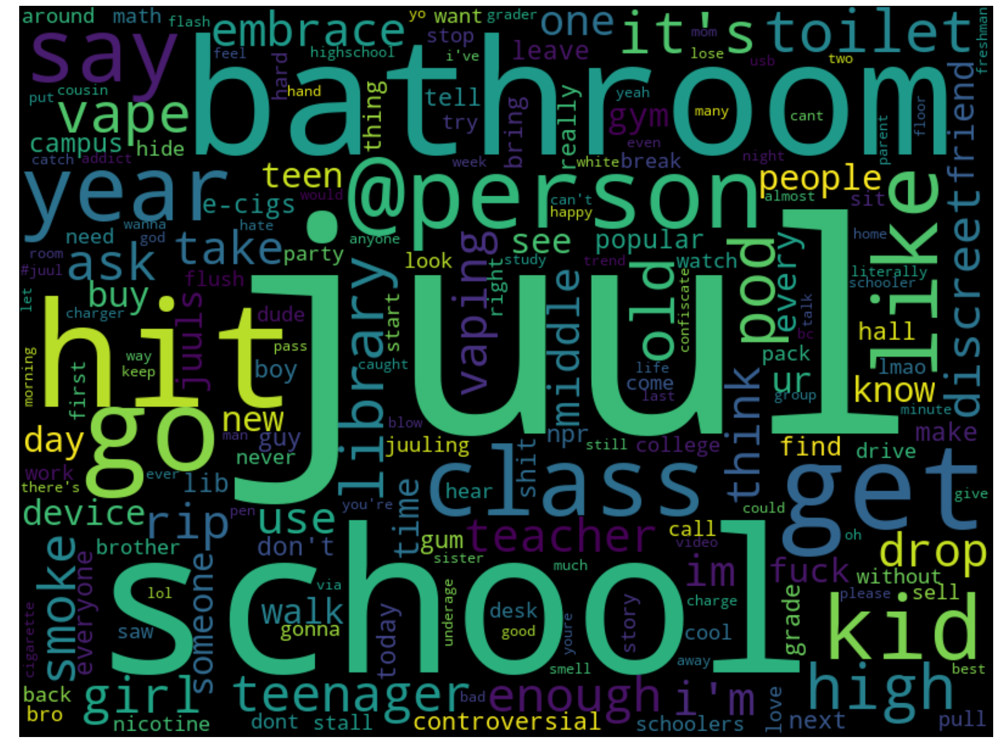

In [132]:
create_wordcloud(school_class.onegrams[school_class.onegrams.IsInteresting].to_dict()['Freq'])

One topic people are talking about is the place they are smoking the juul e.g. bathroom, locker, etc. We can add place of juuling as another class for the school tweets corpus.

In [20]:
def display_school_confusion_matrix(tweets):
    subclasses = {
        'place of usage': { 'lib', 'library', 'hall', 'bathroom', 'toilet', 'washroom', 'gym', 'cafeteria', "bathroom's", 'locker', ('school', 'gym') },
        'flavours': flavour_ngrams,
        'pods': pods_ngrams,
        'buy/sell': buy_sell_ngrams,
        'lost & found': lost_found_ngrams,
        'person tagging': person_tagged_ngrams,
        'wanting juul': want_juul_ngrams,
        'juul usage': juul_usage_ngrams,
        'juul charger': juul_charger_ngrams,
        'quit smoking': quit_smoking_ngrams
    }
    classifications = [get_class_statistics(tweets, class_ngrams, class_name) for class_name, class_ngrams in subclasses.items()]
    display_confusion_matrix(tweets, sorted(classifications, key=lambda x: x.tweets.shape[0], reverse=True))

display_school_confusion_matrix(school_class.tweets)

Number of tweets in place of usage class: 1245 (42.203390%)
Number of users contributing to place of usage class: 1179 (43.092105%)
Total numbeer of tweets associated with these users: 1281 (43.423729%)
Number of tweets in flavours class: 97 (3.288136%)
Number of users contributing to flavours class: 96 (3.508772%)
Total numbeer of tweets associated with these users: 109 (3.694915%)
Number of tweets in pods class: 266 (9.016949%)
Number of users contributing to pods class: 257 (9.393275%)
Total numbeer of tweets associated with these users: 288 (9.762712%)
Number of tweets in buy/sell class: 178 (6.033898%)
Number of users contributing to buy/sell class: 173 (6.323099%)
Total numbeer of tweets associated with these users: 190 (6.440678%)
Number of tweets in lost & found class: 28 (0.949153%)
Number of users contributing to lost & found class: 27 (0.986842%)
Total numbeer of tweets associated with these users: 30 (1.016949%)
Number of tweets in person tagging class: 263 (8.915254%)
Numb

## People tagging tweets deep dive
Similar to the school corpus deep dive, we can have a look at what people who tag each other in tweets dicsuss.

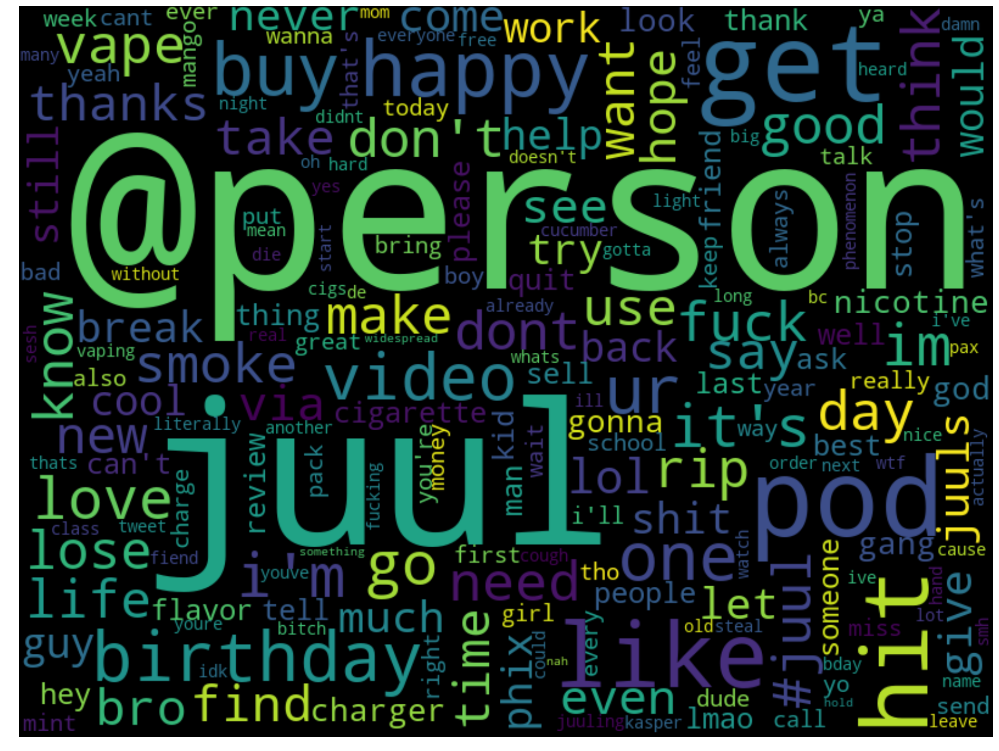

In [135]:
add_ngrams_to_class(person_tagged_class)
create_wordcloud(person_tagged_class.onegrams[person_tagged_class.onegrams.IsInteresting].to_dict()['Freq'])

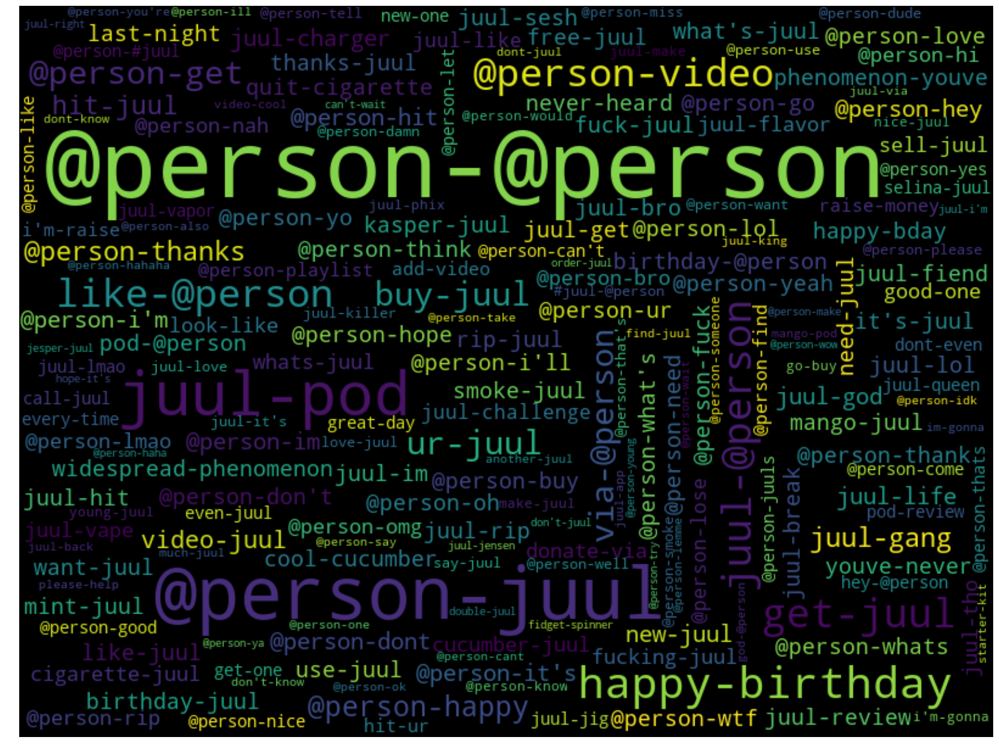

In [136]:
create_wordcloud(person_tagged_class.bigrams.to_dict()['Freq'])

In [30]:
def display_school_confusion_matrix(tweets):
    subclasses = {
        'happy birthday': {('happy', 'birthday'), ('birthday', '@person')},
        'what is juul': {('what', 'juul'), ('what\'s', 'juul'), ('widespread', 'phenomenon')},
        'video tagging': {('@person', 'video'), ('video', '@person')},
        'flavours': flavour_ngrams,
        'pods': pods_ngrams,
        'school': school_ngrams,
        'college': college_ngrams,
        'buy/sell': buy_sell_ngrams,
        'lost & found': lost_found_ngrams,
        'wanting juul': want_juul_ngrams,
        'juul usage': juul_usage_ngrams,
        'juul charger': juul_charger_ngrams,
        'quit smoking': quit_smoking_ngrams
    }
    classifications = [get_class_statistics(tweets, class_ngrams, class_name) for class_name, class_ngrams in subclasses.items()]
    college_index = list(subclasses.keys()).index('college')
    classifications[college_index] = get_class_statistics(tweets[~tweets.index.isin(classifications[list(subclasses.keys()).index('school')].tweets.index)],
                                                          subclasses['college'], 'college') 
    display_confusion_matrix(tweets, sorted(classifications, key=lambda x: x.tweets.shape[0], reverse=True))

display_school_confusion_matrix(person_tagged_class.tweets)

Number of tweets in happy birthday class: 537 (3.235719%)
Number of users contributing to happy birthday class: 501 (3.714413%)
Total numbeer of tweets associated with these users: 706 (4.254037%)
Number of tweets in what is juul class: 260 (1.566643%)
Number of users contributing to what is juul class: 257 (1.905397%)
Total numbeer of tweets associated with these users: 357 (2.151121%)
Number of tweets in video tagging class: 409 (2.464449%)
Number of users contributing to video tagging class: 261 (1.935053%)
Total numbeer of tweets associated with these users: 420 (2.530730%)
Number of tweets in flavours class: 644 (3.880453%)
Number of users contributing to flavours class: 605 (4.485469%)
Total numbeer of tweets associated with these users: 1101 (6.634129%)
Number of tweets in pods class: 1645 (9.912027%)
Number of users contributing to pods class: 1515 (11.232206%)
Total numbeer of tweets associated with these users: 2359 (14.214268%)
Number of tweets in school class: 263 (1.584719

In [25]:
a = {'a': 1, 'b': 2, 'c': 3}
b = list(a.keys())

In [27]:
b.index('b')

1

## Utils
Below contain code snippets useful for testing purpose

In [22]:
retrain_vectors(data)
docvecs = []
for tweet in data.tweets.NormalizedText:
    if len(tweet) > 0:
        doc = np.average(np.vstack(
            map(lambda word: data.onegrams.loc[word].Vector if word in data.onegrams.index else np.zeros(300), tweet)), axis=0)
        docvecs.append(doc)
docvecs = np.vstack(docvecs)

In [146]:
import scipy as spy

cosine = spy.spatial.distance.cosine

def get_most_similar(ngram, topn=10):
    ngram_vector = np.average(np.vstack([data_lemmatized.onegrams.loc[word].Vector for word in ngram]), axis=0)
    sims = []
    for i, vector in enumerate(data_lemmatized.bigrams.Vector):
        sims.append((cosine(ngram_vector, vector), i))
    sims.sort(key=lambda x: x[0])
    top = sims[:topn]
    return [(name, tup[0]) for tup, name in zip(top, data_lemmatized.bigrams.iloc[[i for sim, i in top]].index)]

In [15]:
import csv
with open(r'D:\Documents\HSC\highschool.csv', 'w', encoding='utf-8', newline='') as file:
    writer = csv.writer(file)
    for tweet in school_class.tweets.Text:
        writer.writerow([tweet])

In [26]:
def cluster_tweets(docvecs, tweets):
    estimator = KMeans(n_clusters=8)
    estimator.fit(docvecs)
    model1 = decomposition.PCA(n_components=2)
    model2 = TSNE(n_components=2)
    new_data = model2.fit_transform(model1.fit_transform(docvecs))
    data_source = bk.ColumnDataSource(data={
        'x': new_data[:, 0],
        'y': new_data[:, 1],
        'color': list(map(lambda l: palettes.Category10_8[l], estimator.labels_)),
        'text': tweets
    })
    hover = bk_models.HoverTool(tooltips=[('tweet', '@text')])
    fig = bk.figure(plot_width=800, plot_height=800, tools=[
        hover, bk_models.BoxZoomTool(), bk_models.PanTool(), bk_models.ResetTool(), bk_models.SaveTool()])
    fig.circle('x', 'y', color='color', size=7, source=data_source)
    bk.show(fig)
    return fig

fig_handle = cluster_tweets(docvecs, data_lemmatized.tweets.Text)

C:\Users\Likhit\Anaconda3\lib\site-packages\bokeh\models\sources.py:137: BokehUserWarning: ColumnDataSource's columns must be of the same length. Current lengths: ('color', 97201), ('text', 97207), ('x', 97201), ('y', 97201)
  "Current lengths: %s" % ", ".join(sorted(str((k, len(v))) for k, v in data.items())), BokehUserWarning))
